In [1]:
! pip install TextBlob

    100% |████████████████████████████████| 634kB 1.5MB/s ta 0:00:011


In [2]:
%matplotlib inline
from collections import defaultdict
import json

import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import pandas as pd

from matplotlib import rcParams
import matplotlib.cm as cm
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns 
import matplotlib.gridspec as gridspec 
import matplotlib.gridspec as gridspec 
from matplotlib.colors import ListedColormap
import plotly
import plotly.offline as py # make offline 
py.init_notebook_mode(connected=True)
import plotly.tools as tls
import plotly.graph_objs as go
from plotly.graph_objs import *
import plotly.tools as tls
import plotly.figure_factory as fig_fact
plotly.tools.set_config_file(world_readable=True, sharing='public')
import re # regular expression
import string # for finding punctuation in text
import nltk # preprocessing text
from textblob import TextBlob

In [3]:
#colorbrewer2 Dark2 qualitative color table
dark2_colors = [(0.10588235294117647, 0.6196078431372549, 0.4666666666666667),
                (0.8509803921568627, 0.37254901960784315, 0.00784313725490196),
                (0.4588235294117647, 0.4392156862745098, 0.7019607843137254),
                (0.9058823529411765, 0.1607843137254902, 0.5411764705882353),
                (0.4, 0.6509803921568628, 0.11764705882352941),
                (0.9019607843137255, 0.6705882352941176, 0.00784313725490196),
                (0.6509803921568628, 0.4627450980392157, 0.11372549019607843)]

rcParams['figure.figsize'] = (10, 6)
rcParams['figure.dpi'] = 150
rcParams['axes.color_cycle'] = dark2_colors
rcParams['lines.linewidth'] = 2
rcParams['axes.facecolor'] = 'white'
rcParams['font.size'] = 14
rcParams['patch.edgecolor'] = 'white'
rcParams['patch.facecolor'] = dark2_colors[0]
rcParams['font.family'] = 'StixGeneral'


def remove_border(axes=None, top=False, right=False, left=True, bottom=True):
    """
    Minimize chartjunk by stripping out unnecesasry plot borders and axis ticks
    
    The top/right/left/bottom keywords toggle whether the corresponding plot border is drawn
    """
    ax = axes or plt.gca()
    ax.spines['top'].set_visible(top)
    ax.spines['right'].set_visible(right)
    ax.spines['left'].set_visible(left)
    ax.spines['bottom'].set_visible(bottom)
    
    #turn off all ticks
    ax.yaxis.set_ticks_position('none')
    ax.xaxis.set_ticks_position('none')
    
    #now re-enable visibles
    if top:
        ax.xaxis.tick_top()
    if bottom:
        ax.xaxis.tick_bottom()
    if left:
        ax.yaxis.tick_left()
    if right:
        ax.yaxis.tick_right()
        
pd.set_option('display.width', 500)
pd.set_option('display.max_columns', 100)

/Users/Xuhuiz2/anaconda3/lib/python3.6/site-packages/matplotlib/__init__.py:800: MatplotlibDeprecationWarning:

axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.



# 1.0 Discription of the dataset

In [37]:
business=pd.read_csv("/Users/Xuhuiz2/Desktop/yelp_business.csv")
reviews=pd.read_csv("/Users/Xuhuiz2/Desktop/yelp_review.csv")
user=pd.read_csv("/Users/Xuhuiz2/Desktop/yelp_user.csv")

# 2.0 Exploratory Data Analysis

## 2.1 Ratings distribution:

/Users/Xuhuiz2/anaconda3/lib/python3.6/site-packages/seaborn/categorical.py:1460: FutureWarning:

remove_na is deprecated and is a private function. Do not use.



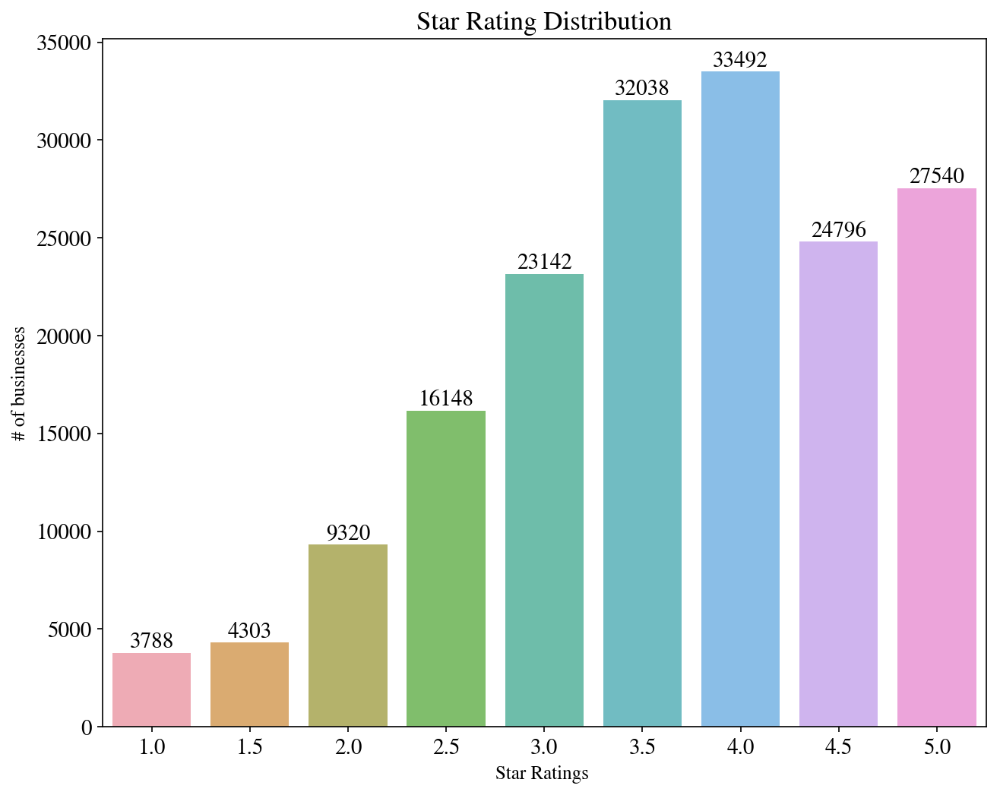

In [6]:
x=business['stars'].value_counts()
x=x.sort_index()
plt.figure(figsize=(10,8))
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Star Rating Distribution")
plt.ylabel('# of businesses', fontsize=12)
plt.xlabel('Star Ratings ', fontsize=12)
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

In [34]:
user.loc[(user['average_stars'] >= 1.0) & (user['average_stars'] <= 1.25), 'average_stars'] = 1.0
user.loc[(user['average_stars'] > 1.25) & (user['average_stars'] <= 1.75), 'average_stars'] = 1.5
user.loc[(user['average_stars'] > 1.75) & (user['average_stars'] <= 2.25), 'average_stars'] = 2.0
user.loc[(user['average_stars'] > 2.25) & (user['average_stars'] <= 2.75), 'average_stars'] = 2.5
user.loc[(user['average_stars'] > 2.75) & (user['average_stars'] <= 3.25), 'average_stars'] = 3.0
user.loc[(user['average_stars'] > 3.25) & (user['average_stars'] <= 3.75), 'average_stars'] = 3.5
user.loc[(user['average_stars'] > 3.75) & (user['average_stars'] <= 4.25), 'average_stars'] = 4.0
user.loc[(user['average_stars'] > 4.25) & (user['average_stars'] <= 4.75), 'average_stars'] = 4.5
user.loc[(user['average_stars'] > 4.75) & (user['average_stars'] <= 5.0), 'average_stars'] = 5.0

/Users/Xuhuiz2/anaconda3/lib/python3.6/site-packages/seaborn/categorical.py:1460: FutureWarning:

remove_na is deprecated and is a private function. Do not use.



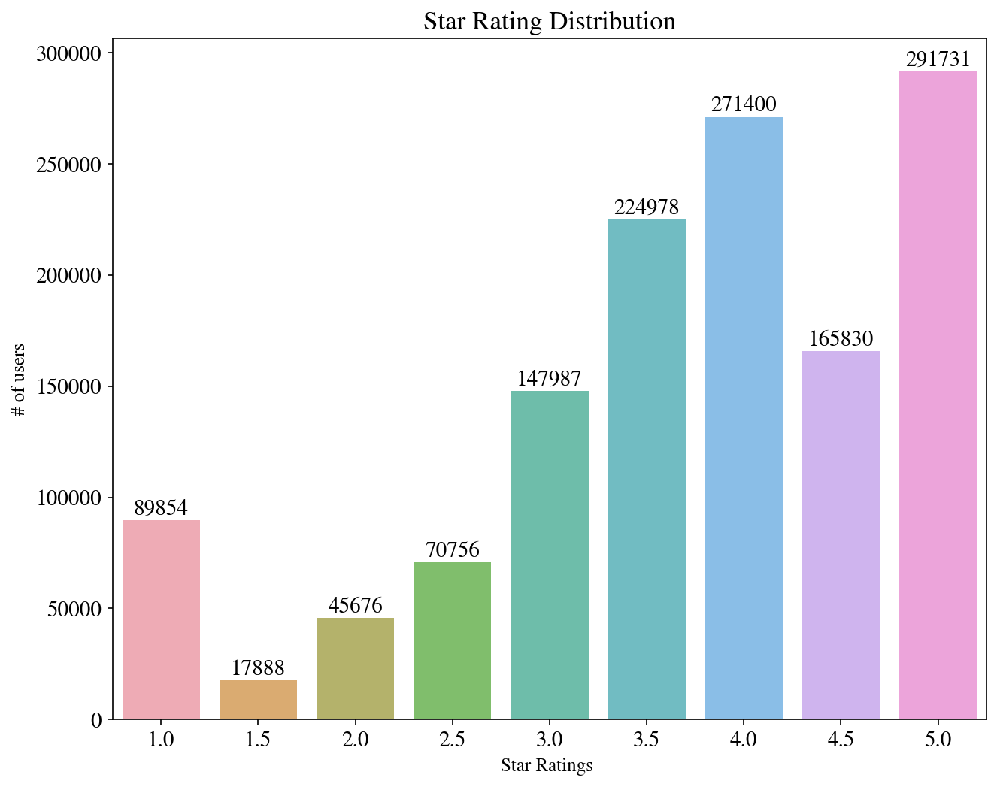

In [36]:
x=user['average_stars'].value_counts()
x=x.sort_index()
plt.figure(figsize=(10,8))
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Star Rating Distribution")
plt.ylabel('# of users', fontsize=12)
plt.xlabel('Star Ratings ', fontsize=12)
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

In [117]:
mapbox_access_token = 'pk.eyJ1IjoiZW1tYXl1IiwiYSI6ImNqZWV3NjJ5YjFhOHEzM28yMGp2NGJmaGcifQ.thj_-iQAsFi1W5XgOft6Fg'
data = Data([
    Scattermapbox(
        lat=business.latitude.tolist(),
        lon=business.longitude.tolist(),
        mode='markers',
        # add 'bar' as a marker icon. so it's look beautiful 
        marker=Marker(
            symbol= "bar",
            size=9,
            color = "r"
        )
    )
])
layout = Layout(
    # add title
    title='Zoom to your location and find your desire restaurants',
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        # add our access token
        accesstoken=mapbox_access_token,
        bearing=0,
        # add center location to our map
        center=dict(
            lat=39.4440302947,
            lon=-98.9565517008
        ),
        # use style light
        style='light',
        pitch=0,
        # zoom label to 3
        zoom=3
    ),
)
# let's make the final figure
fig = dict(data=data, layout=layout)
# finally plot the map
py.iplot(fig, filename='Multiple Mapbox')

In [38]:
reviews = reviews[['review_id', 'user_id', 'business_id', 'stars', 'date', 'useful']]

In [39]:
business['biz_name'] = business['name']
business['business_review_count'] = business['review_count']
business['business_stars'] = business['stars']
business = business.drop(['name','review_count','stars'], axis = 1)
business = business[['business_id', 'latitude', 'longitude', 'categories', 'biz_name', 'business_review_count', 'business_stars']]

In [40]:
business = business.dropna(axis = 0)

In [41]:
user['user_name'] = user['name']
user['user_review_count'] = user['review_count']

In [42]:
user = user.drop(['name', 'review_count'], axis = 1)
user = user[['user_id', 'user_name', 'user_review_count', 'average_stars']]

In [43]:
user = user.dropna(axis = 0)

In [44]:
review_user = pd.merge(reviews, user, on = 'user_id', how = 'inner')

In [45]:
final_df = pd.merge(review_user, business, on = 'business_id', how = 'inner')

In [64]:
avg_biz_star = final_df.groupby('business_id')['business_stars'].mean()

In [65]:
avg_biz_star = pd.DataFrame(avg_biz_star)

In [66]:
avg_biz_star = avg_biz_star.reset_index()

In [67]:
avg_biz_star['business_avg'] = avg_biz_star['business_stars']
avg_biz_star = avg_biz_star.drop('business_stars', axis = 1)

In [68]:
final_df = pd.merge(final_df, avg_biz_star, on = 'business_id', how = 'inner')

In [69]:
final_df = final_df.drop('business_stars', axis = 1)

In [70]:
final_df['usefulvotes_review'] = final_df['useful']
final_df['user_avg'] = final_df['average_stars']

In [71]:
final_df = final_df.drop(['useful', 'average_stars'], axis = 1)

In [72]:
final_df = final_df[['user_id', 'business_id', 'date', 'review_id', 'stars', 'usefulvotes_review', 'user_name', 'categories', 'biz_name', 'latitude', 'longitude', 'business_avg', 'business_review_count', 'user_avg', 'user_review_count']]

In [73]:
import re

In [80]:
final_df = final_df[final_df['categories'].str.contains('Restaurants')]

In [81]:
final_df.head()

,user_id,business_id,date,review_id,stars,usefulvotes_review,user_name,categories,biz_name,latitude,longitude,business_avg,business_review_count,user_avg,user_review_count
0,bv2nCi5Qv5vroFiqKGopiw,AEx2SYEUJmTxVVB18LlCwA,2016-05-28,vkVSCC7xljjrAI4UGfnKEQ,5,0,Tim,Diners;Food;Restaurants;Delis,"""Wilensky's""",45.523333,-73.594859,4.0,84,4.67,6
1,xYciRtVZ1PW4IxSX4oJ1aw,AEx2SYEUJmTxVVB18LlCwA,2016-02-22,vm1b1keOzwHjtGZEPPuYXA,5,4,Anh,Diners;Food;Restaurants;Delis,"""Wilensky's""",45.523333,-73.594859,4.0,84,3.41,177
2,DVOOF0Z627DyrZ4XKQbTgA,AEx2SYEUJmTxVVB18LlCwA,2017-08-08,jUzausdZ_ujqe_n8BlBj-g,5,0,Jessica,Diners;Food;Restaurants;Delis,"""Wilensky's""",45.523333,-73.594859,4.0,84,3.98,40
3,5Ymfsf9fAYz-Ds_p0xawVQ,AEx2SYEUJmTxVVB18LlCwA,2013-03-29,SXwA9KZ-Nc_hMARk_3cJ7g,5,9,Anthony,Diners;Food;Restaurants;Delis,"""Wilensky's""",45.523333,-73.594859,4.0,84,4.52,79
4,5JoKz3mU42Cp906KRXDwJw,AEx2SYEUJmTxVVB18LlCwA,2009-01-17,oCRDwF3tszAkeszSfxwthg,4,4,Daniel,Diners;Food;Restaurants;Delis,"""Wilensky's""",45.523333,-73.594859,4.0,84,4.00,3


Text(0.5,1,'Review Count per User')

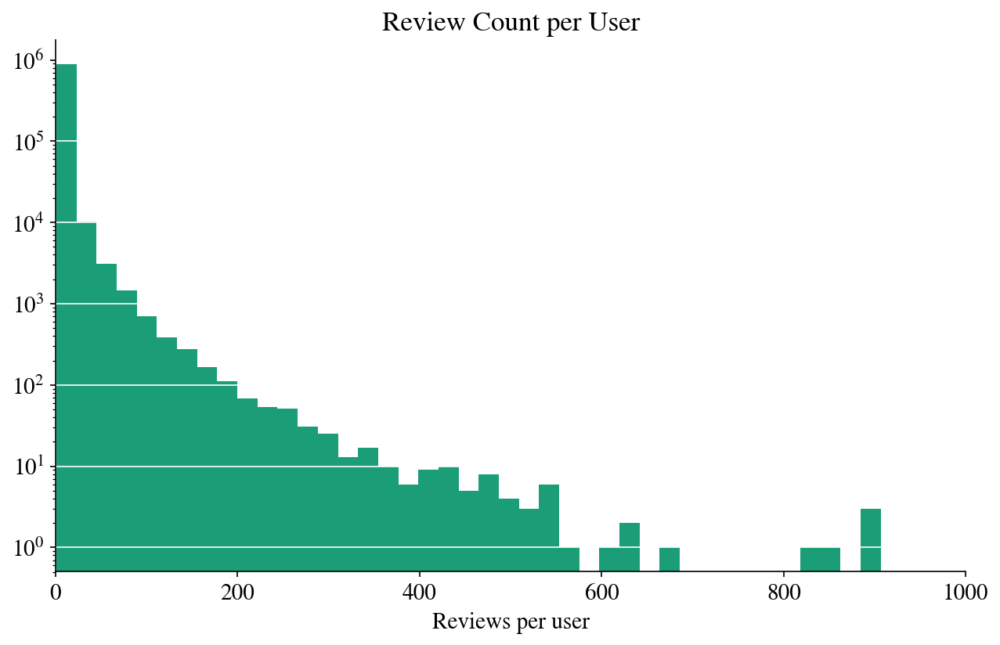

In [94]:
urc=final_df.groupby('user_id').review_id.count()
ax=urc.hist(bins=100, log=True)
remove_border(ax)
plt.xlabel("Reviews per user")
plt.xlim(0,1000)
plt.grid(False)
plt.grid(axis = 'y', color ='white', linestyle='-')
plt.title("Review Count per User")

Text(0.5,1,'Review Count per Restaurant')

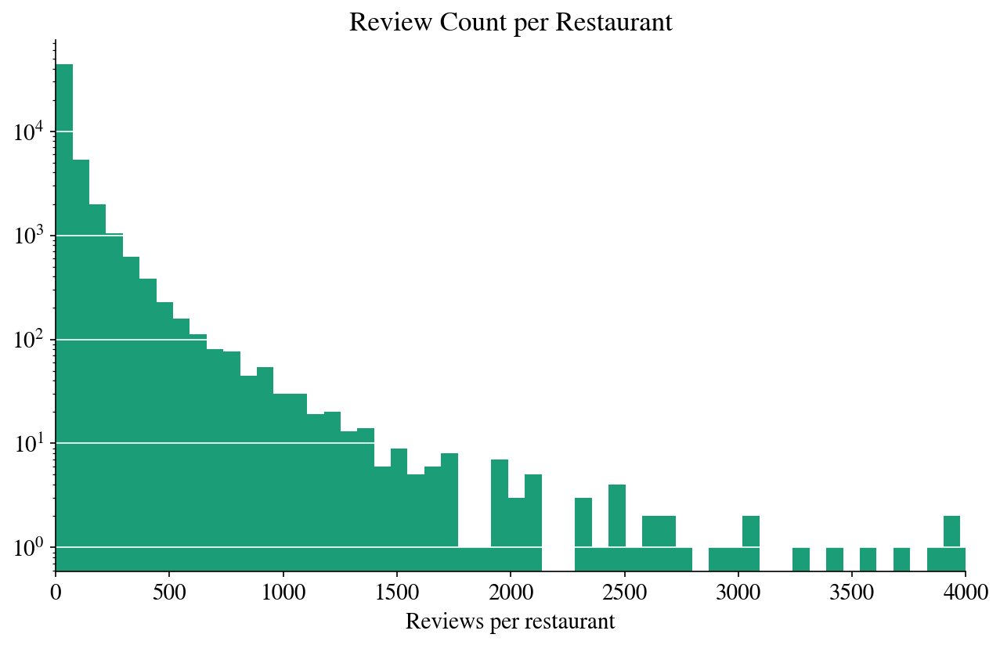

In [95]:
brc=final_df.groupby('business_id').review_id.count()
ax=brc.hist(bins=100, log=True)
remove_border(ax)
plt.xlabel("Reviews per restaurant")
plt.xlim(0,4000)
plt.grid(False)
plt.grid(axis = 'y', color ='white', linestyle='-')
plt.title("Review Count per Restaurant")

In [97]:
print("Number of Reviews",final_df.shape[0])
print("Number of Users", final_df.user_id.unique().shape[0], "Number of Businesses", final_df.business_id.unique().shape[0])

Number of Reviews 3220609
Number of Users 908526 Number of Businesses 54618


/Users/Xuhuiz2/anaconda3/lib/python3.6/site-packages/seaborn/categorical.py:1460: FutureWarning:

remove_na is deprecated and is a private function. Do not use.



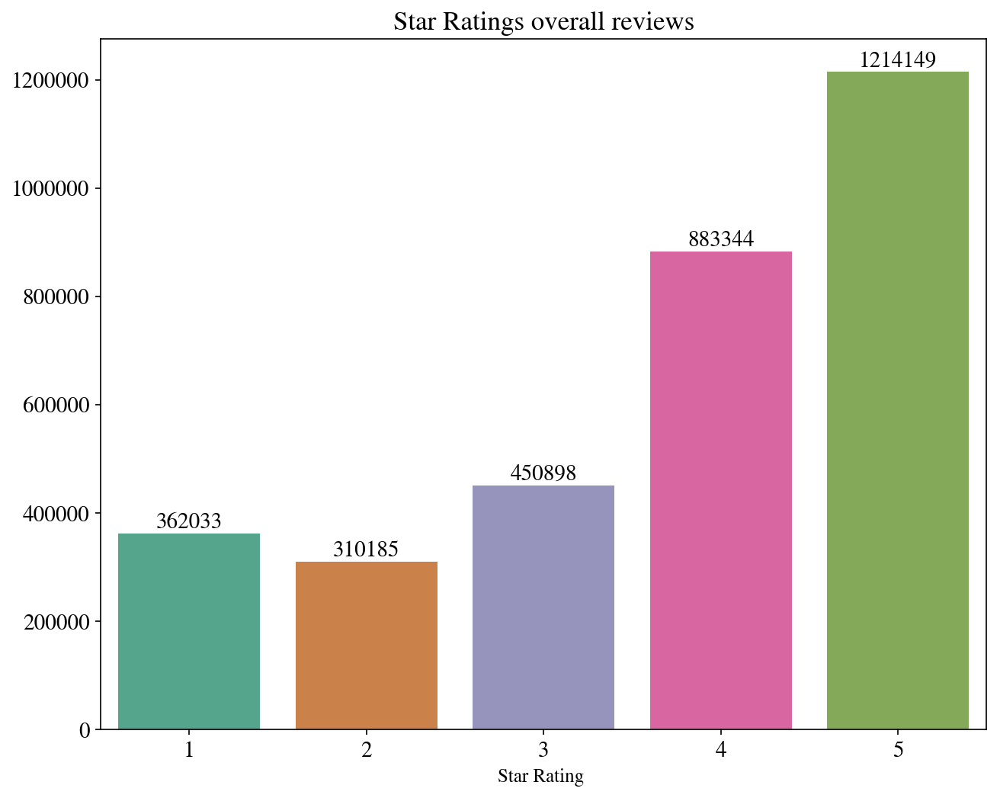

In [113]:
x=final_df['stars'].value_counts()
x=x.sort_index()
plt.figure(figsize=(10,8))
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Star Ratings overall reviews")
plt.xlabel('Star Rating ', fontsize=12)
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()